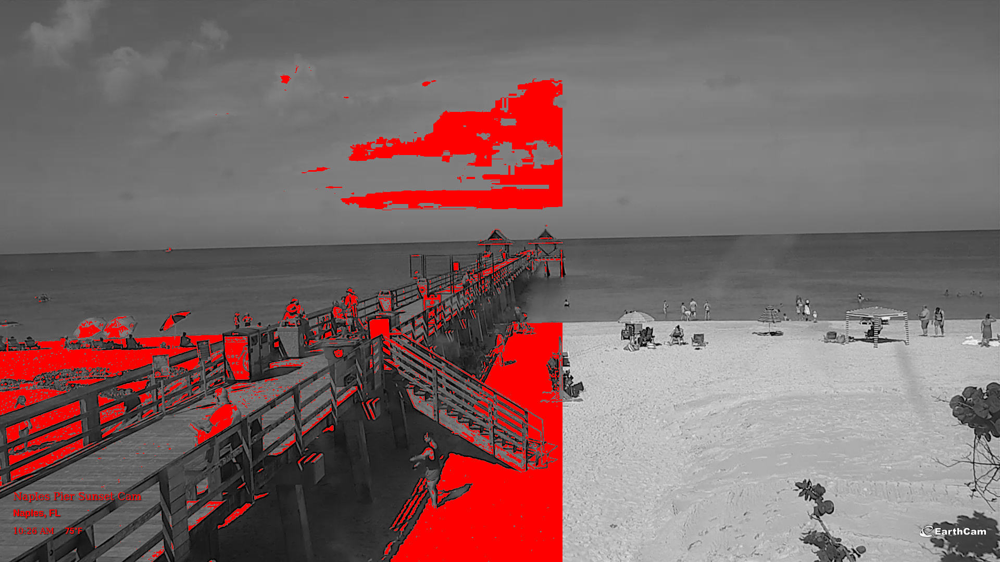

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
im = cv2.imread("Beach1.png")
im2 = cv2.imread("Beach2.png")
gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
hsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)
gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
gray3 = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
#You can directly use gray = cv2.imread("\Test.jpg", 0) for input grayscale image
#print(gray)
gray = gray/256
gray2 = gray/256
for i in range (len(gray)):
  for j in range (len(gray)):
    if (abs(gray[i][j]-gray2[i][j]) > .5):
      gray3[i][j] = (0, 0, 255)
      #print(i)
      #print(gray[i][j])
#      continue

gray = gray*256
cv2_imshow(gray3)
#cv2_imshow(gray2)


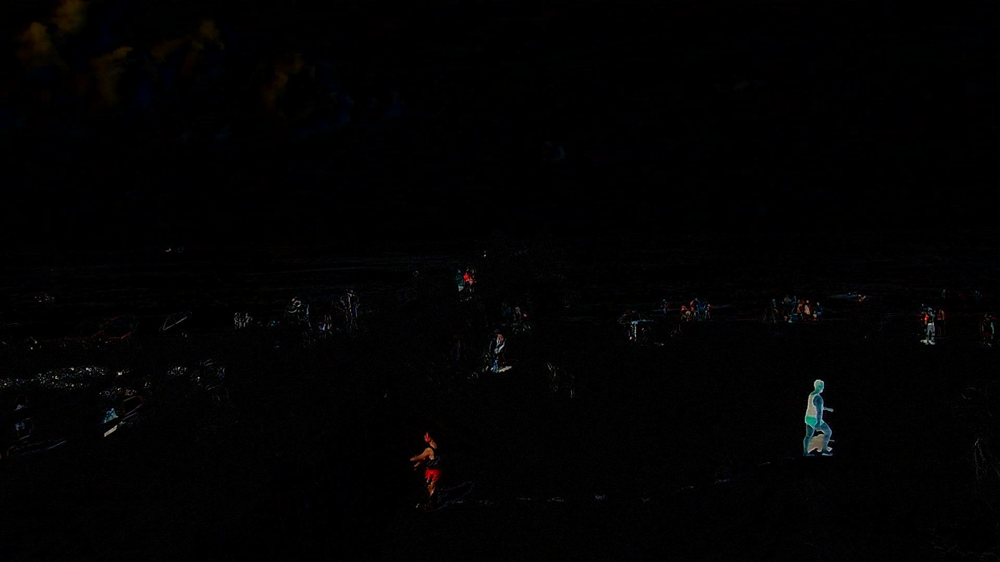

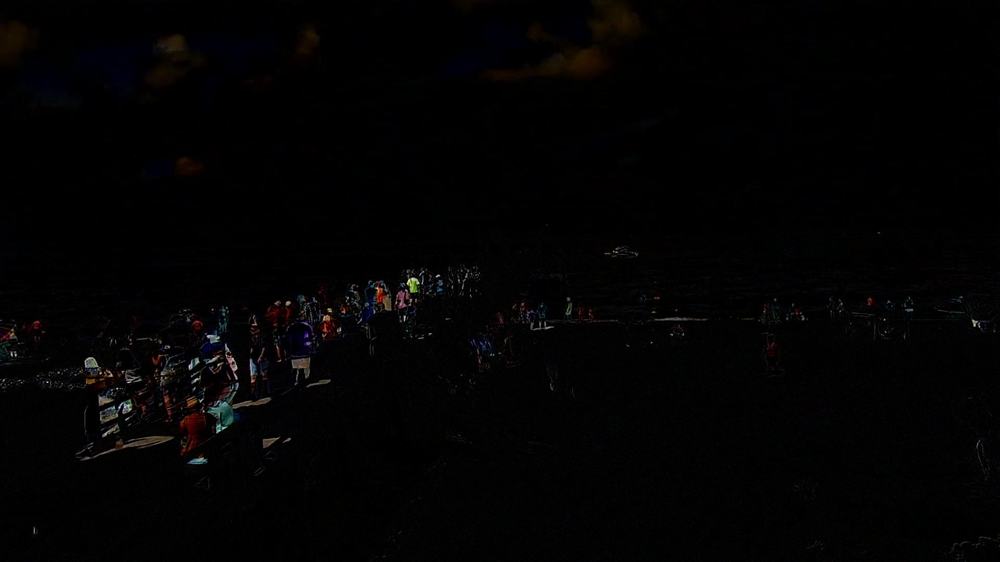

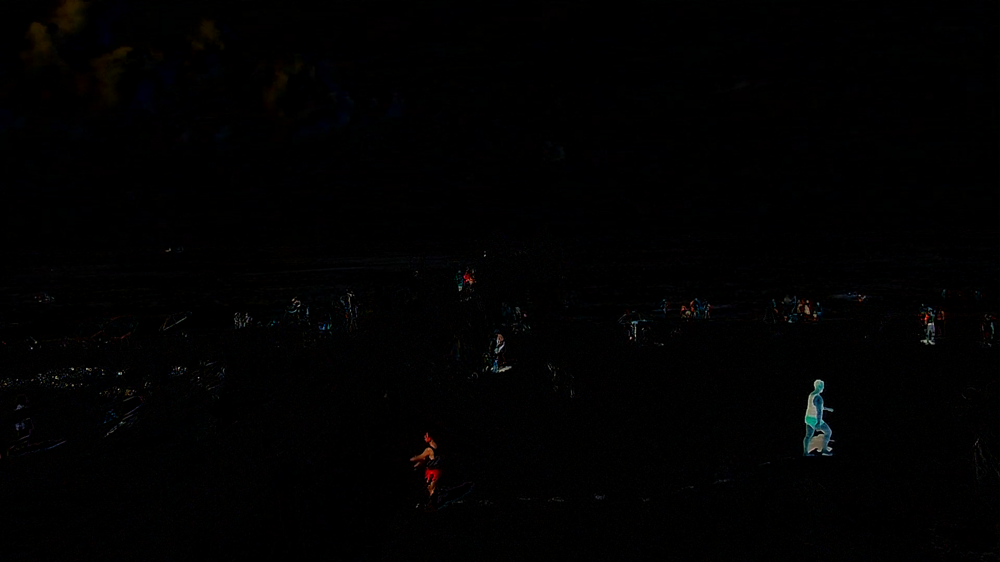

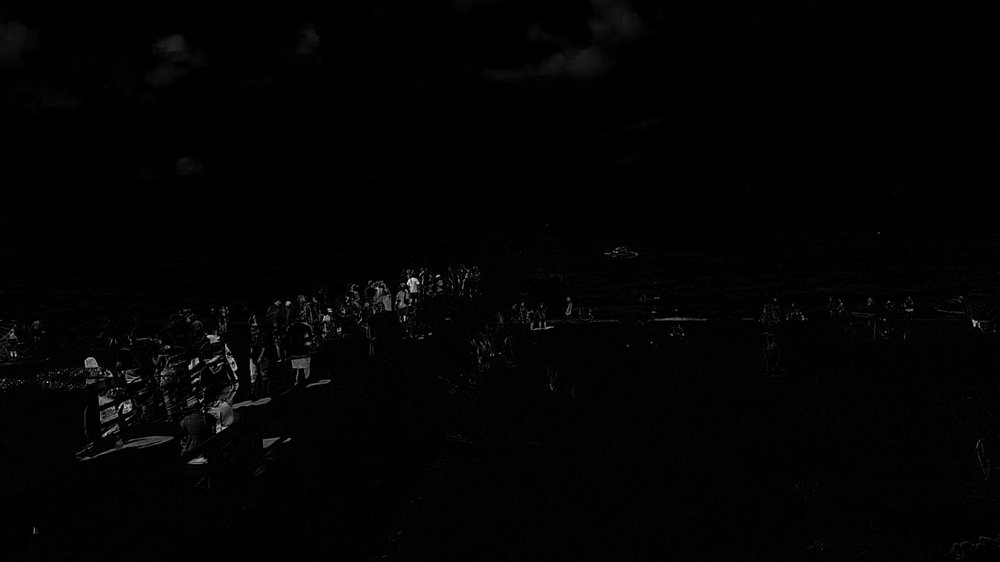

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
im = cv2.imread("Beach1.png")
im2 = cv2.imread("Beach2.png")
im3 = cv2.imread("Beach3.png")
im4 = cv2.imread("Beach4.png")
gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
hsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)
gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
gray3 = cv2.cvtColor(gray2, cv2.COLOR_GRAY2BGR)
#You can directly use gray = cv2.imread("\Test.jpg", 0) for input grayscale image
#print(gray)
gray = gray/256
gray2 = gray/256
for i in range (len(gray)):
  for j in range (len(gray)):
    if (abs(gray2[i][j]-gray[i][j]) > .9):
      gray3[i][j] = (0, 0, 255)
      #print(i)
      #print(gray[i][j])
#      continue

#gray = gray*256
#cv2_imshow(gray3)
#cv2_imshow(hsv)
#cv2_imshow(gray2)
diff = cv2.subtract(im, im2)
diff2 = cv2.subtract(im3, im4)
diff3 = cv2.subtract(diff, diff2)
diff2_gray = cv2.cvtColor(diff2, cv2.COLOR_BGR2GRAY)
cv2_imshow(diff)
cv2_imshow(diff2)
cv2_imshow(diff3)
cv2_imshow(diff2_gray)

Human Detected :  8


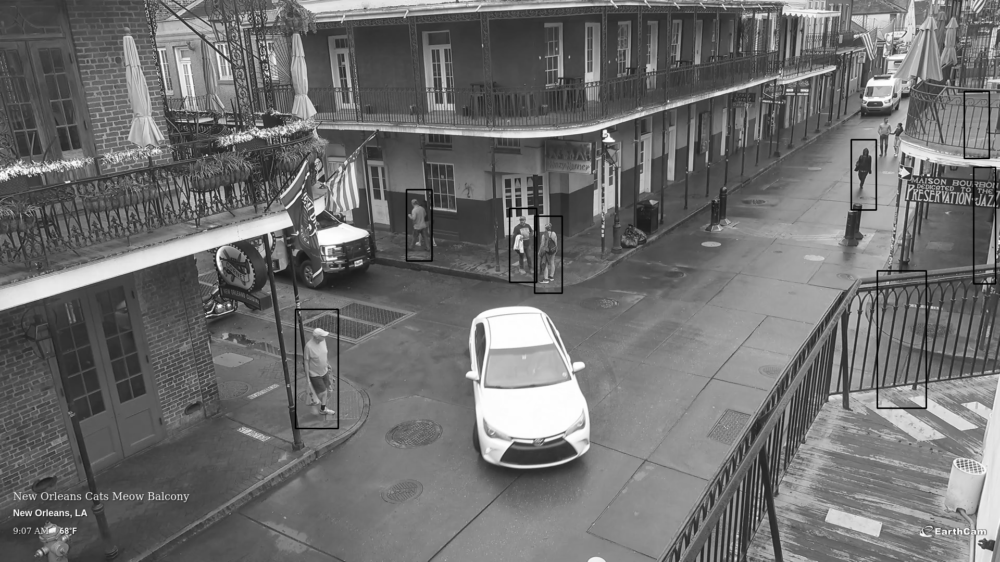

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread("LouisV2.png",0)
winSize = (16,16)
blockSize = (4,4)
blockStride = (8,8)
cellSize = (8,8)
nbins = 9
derivAperture = 1
winSigma = 4.
histogramNormType = 0
L2HysThreshold = 2.0000000000000001e-01
gammaCorrection = 0
nlevels = 64
#hog = cv2.HOGDescriptor(winSize,blockSize,blockStride,cellSize,nbins,derivAperture,winSigma,
#                        histogramNormType,L2HysThreshold,gammaCorrection,nlevels)
hog = cv2.HOGDescriptor()

hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
#compute(img[, winStride[, padding[, locations]]]) -> descriptors
#winStride = (8,8)
#padding = (8,8)
#locations = ((10,20),)
#hist = hog.compute(image,winStride,padding,locations)
#new stuff
(humans, _) = hog.detectMultiScale(image, winStride=(8, 8),
padding=(32, 32), scale=1.1)

# getting no. of human detected
print('Human Detected : ', len(humans))

# loop over all detected humans
for (x, y, w, h) in humans:
   pad_w, pad_h = int(0.15 * w), int(0.01 * h)
   cv2.rectangle(image, (x + pad_w, y + pad_h), (x + w - pad_w, y + h - pad_h), (0, 255, 0), 2)

# display the output image
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

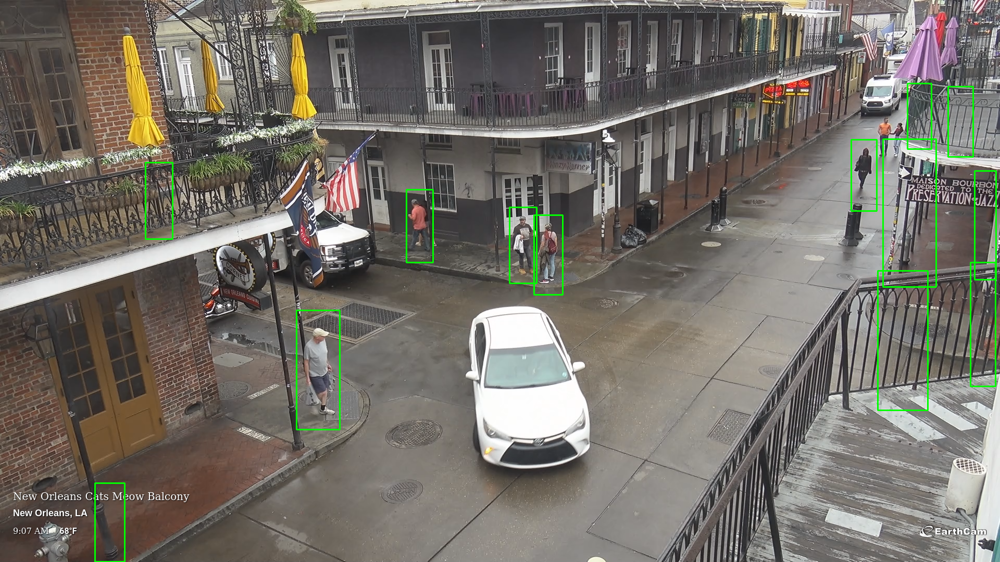

[0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]
[0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]


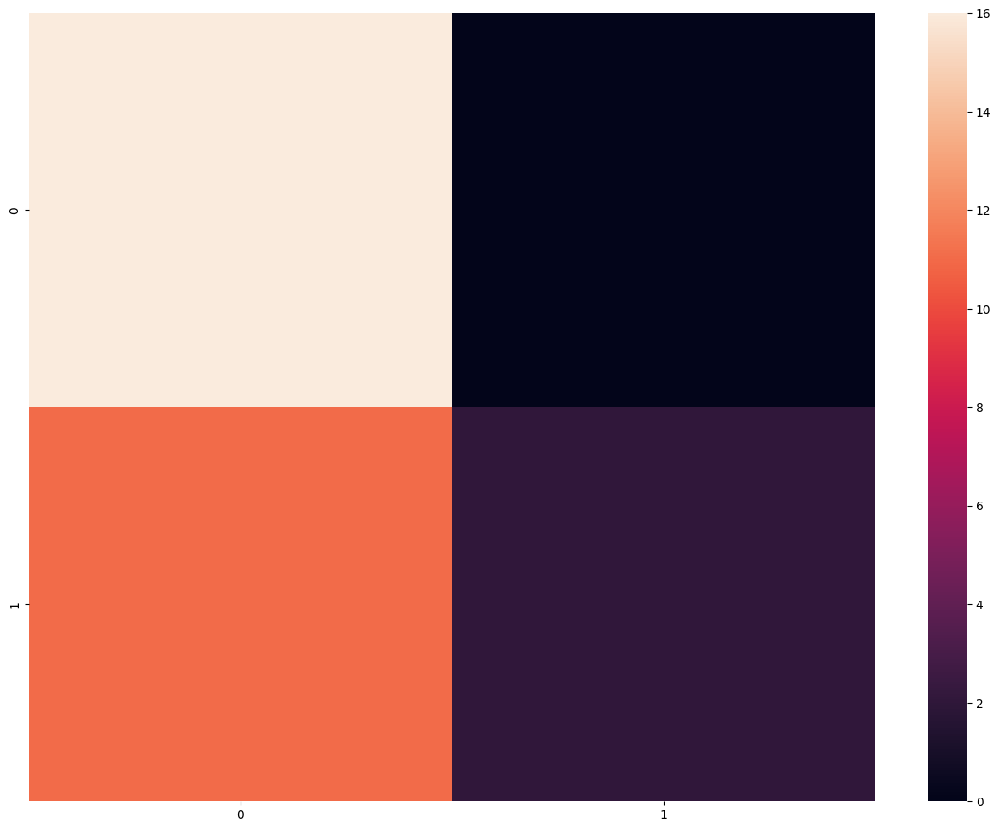

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from PIL import ImageGrab
import cv2
import time
import numpy as np
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sn
import pandas as pd
from scipy.stats import multivariate_normal
from sklearn import datasets
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, plot_tree
from scipy.stats import multivariate_normal
from sklearn import datasets
import scipy


# Reading the Image
image = cv2.imread('LouisV2.png')
image2 = cv2.imread('Louis3.png')
image3 = cv2.imread('Louis4.png')

# initialize the HOG descriptor
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# detect humans in input image
(humans, _) = hog.detectMultiScale(image, winStride=(5, 5), 
                                   padding=(32, 32), scale=1.1)
(humans2, _) = hog.detectMultiScale(image2, winStride=(5, 5), 
                                   padding=(32, 32), scale=1.1)
(humans3, _) = hog.detectMultiScale(image3, winStride=(5, 5), 
                                   padding=(32, 32), scale=1.1)

#joined_humans = np.concatenate(humans,humans2,humans3)


human_target = [1,0,1,0,0,1,1,0,0,1,0,0,0,0,1,1,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,1]
human_target2 = [0,1,1,1,0,1,0,0,0,0,0,1]
human_target3 = [0,0,0,1,1,0,0,0,0,1,0,1,1]
# getting no. of human detected
#print('Human Detected : ', len(humans3))
# loop over all detected humans
#print(humans3)
#print('Human Detected : ', len(humans))
#print(humans)
#print(humans2)
#print(humans3)

total = np.row_stack((humans, humans2, humans3))

#new_humans = np.delete(humans3, 12, 0)
#print('Human Detected : ', len(new_humans))

#print(new_humans)

for (x, y, w, h) in humans:
   pad_w, pad_h = int(0.15 * w), int(0.01 * h)
   cv2.rectangle(image, (x + pad_w, y + pad_h), (x + w - pad_w, y + h - pad_h), (0, 255, 0), 2)

# display the output image
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

import numpy as np
import matplotlib.pyplot as plt

from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier, plot_tree

# hyperparameters
n_classes = 2
plot_colors = 'ryb'
plot_step = 0.02

# Load the iris dataset
#iris = load_iris()

plt.figure(figsize=(16,12))

X = total.copy()
y = human_target.copy()
trainX, testX, trainY, testY = train_test_split(X, y, test_size = 0.75)
clf = DecisionTreeClassifier().fit(trainX, trainY)

predictedY = clf.predict(testX)
sn.heatmap(confusion_matrix(testY, predictedY))
print(testY)
print(predictedY)
#plot_tree(clf, filled=True)
plt.show()

# **Model using active Screen Capture**

In [ ]:
from PIL import ImageGrab
import cv2
import time
import numpy as np
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sn
import pandas as pd
from scipy.stats import multivariate_normal
from sklearn import datasets
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, plot_tree
from scipy.stats import multivariate_normal
from sklearn import datasets
import scipy

class BayesClassifier:
    def fit(self, X, Y):     
        # find the unique labels
        uniqueY = np.unique(Y)
        
        n = X.shape[0]
        self.d = X.shape[1]
        self.k = uniqueY.shape[0]
        
        # initialize the outputs
        self.prior = np.zeros([self.k, 1])
        self.mu = np.zeros([self.k, self.d])
        self.Sigma = np.zeros([self.k, self.d, self.d])
        
        # compute class prior probabilities, sample means, and sample covariances
        for i, y in enumerate(Y):
            # split the X into its classes
            print("Y")
            print(Y)
            print("y")
            print(y)
            Xi = X[Y == y]
            
            # compute the size of each class
            ni = Xi.shape[0]
            
            # compute the priors
            self.prior[i] = ni / n
            
            # compute the sample mean
            self.mu[i] = np.mean(Xi, axis = 0)
            
            # compute the centered data
            XiBar = Xi - self.mu[i]
            
            # compute the sample covariance
            self.Sigma[i] = (1/ni) * XiBar.T @ XiBar
            
    def predict(self, X):
        n = X.shape[0]
        
        posteriorPre = np.zeros([n, self.k])
        
        # compute the pdf term of the posterior probabilities
        for i in range(n):
            for j in range(self.k):
                posteriorPre[i][j] = scipy.stats.multivariate_normal.pdf(X[i], self.mu[j], self.Sigma[j], allow_singular = True)
                
        # compute a vector proportional to the posterior probabilities
        posterior = posteriorPre * self.prior.T

        # find the label for each datapoint by choosing the most probable class
        predictions = np.argmax(posterior, axis = 1)
        
        return predictions


##################################################
##################################################
##################################################


human_target = []
human_target.append(0)
humans = np.empty([1,4])
while True:
   time.sleep(5)
   humans2 = []

   screen2 = np.array(ImageGrab.grab(bbox=(0,0,1920,1080)))
   cv2.imwrite('/home/andy/Screengrab.png',screen2)

   image = cv2.imread('/home/andy/Screengrab.png')
   hog = cv2.HOGDescriptor()
   hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
   (humans2, _) = hog.detectMultiScale(image, winStride=(2, 2), 
                                   padding=(32, 32), scale=1.1)
   for (x, y, w, h) in humans2:
      pad_w, pad_h = int(0.15 * w), int(0.01 * h)
      cropped_image = image[(y + pad_h):(y + h - pad_h),(x + pad_w):(x + w - pad_w)]
      cv2.imwrite('/home/andy/cropped.png', cropped_image)    
      val = input("Is this a person? (Y/N)")
      if val == 'y':
         human_target.append(1)
      else:
         human_target.append(0)

   humans = np.row_stack((humans, humans2))
   cont = input("Continue?")
   if cont == 'n':
      break 

humans_pd = pd.DataFrame(humans)
humans_tar_pd = pd.DataFrame(human_target)

humans_pd.to_csv('humans.csv')
humans_tar_pd.to_csv('humans_target.cvs')

# hyperparameters
n_classes = 2
plot_colors = 'ryb'
plot_step = 0.02

# Load the iris dataset
#iris = load_iris()

plt.figure(figsize=(16,12))

X = humans.copy()
y = human_target.copy()
trainX, testX, trainY, testY = train_test_split(X, y, test_size = 0.35)
clf = DecisionTreeClassifier().fit(trainX, trainY)

predictedY = clf.predict(testX)
sn.heatmap(confusion_matrix(testY, predictedY))
plot_tree(clf, filled=True)
plt.show()


# split the data into train and test sets
trainX, testX, trainY, testY = train_test_split(X, Y, test_size = 0.25)

# build the classifier
model = RandomForestClassifier(n_jobs = -1)

# fit the classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Classification Report:\n\n', classification_report(trainY, predictedY))

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('\nTesting Classification Report:\n\n', classification_report(testY, predictedY))

# predict the labels of the test set
predictedY = model.predict(testX)

print('\nTesting Confusion Matrix:\n')

sn.heatmap(confusion_matrix(testY, predictedY))
plt.figure()

############# Bayes

model = BayesClassifier()

# fit the Bayes classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the test set
predictedY = model.predict(testX)

# print predicted and true class labels
print('\nPredicted class labels:\n', predictedY)
print('\nTrue class labels:\n', testY)

# print quality metrics
print('\nClassification Report:\n\n', classification_report(testY, predictedY))
print('\nConfusion Matrix:\n')

sn.heatmap(confusion_matrix(testY, predictedY), annot = True)

time.sleep(15)
############# Naive Bayes

model = GaussianNB()

# fit the Bayes classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('\nClassification Report:\n\n', classification_report(testY, predictedY))
print('\nConfusion Matrix:\n')

sn.heatmap(confusion_matrix(testY, predictedY), annot = True)


# **Model using CSV files**

In [ ]:
from PIL import ImageGrab
import cv2
import time
import numpy as np
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sn
import pandas as pd
from scipy.stats import multivariate_normal
from sklearn import datasets
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, plot_tree
from scipy.stats import multivariate_normal
from sklearn import datasets
import scipy

class BayesClassifier:
    def fit(self, X, Y):     
        # find the unique labels
        Y = np.unique(Y)
        n = X.shape[0]
        self.d = X.shape[1]
        self.k = Y.shape[0]
        
        # initialize the outputs
        self.prior = np.zeros([self.k, 1])
        self.mu = np.zeros([self.k, self.d])
        self.Sigma = np.zeros([self.k, self.d, self.d])
        
        # compute class prior probabilities, sample means, and sample covariances
        for i in range(1):

            # split the X into its classes
            #print(Y)
            #print(y)
            Xi = X[Y == i]
            
            # compute the size of each class
            ni = Xi.shape[0]
            
            # compute the priors
            self.prior[i] = ni / n
            
            # compute the sample mean
            self.mu[i] = np.mean(Xi, axis = 0)
            
            # compute the centered data
            XiBar = Xi - self.mu[i]
            
            # compute the sample covariance
            self.Sigma[i] = (1/ni) * XiBar.T @ XiBar
            
    def predict(self, X):
        n = X.shape[0]
        
        posteriorPre = np.zeros([n, self.k])
        
        # compute the pdf term of the posterior probabilities
        for i in range(n):
            for j in range(self.k):
                posteriorPre[i][j] = scipy.stats.multivariate_normal.pdf(X[i], self.mu[j], self.Sigma[j], allow_singular = True)
                
        # compute a vector proportional to the posterior probabilities
        posterior = posteriorPre * self.prior.T

        # find the label for each datapoint by choosing the most probable class
        predictions = np.argmax(posterior, axis = 1)
        
        return predictions


##################################################
##################################################
##################################################

humans = pd.read_csv("humans.csv").to_numpy()
human_target = pd.read_csv("humans_target.csv").to_numpy()

#human_target = human_target.drop(columns = human_target.columns[0])
#human_target.to_numpy()
#print(human_target)
# hyperparameters
n_classes = 2
plot_colors = 'ryb'
plot_step = 0.02

plt.figure(figsize=(16,12))

X = humans.copy()
y = human_target.copy()
print(X)
print(y)
trainX, testX, trainY, testY = train_test_split(X, y, test_size = 0.35)
clf = DecisionTreeClassifier().fit(trainX, trainY)

predictedY = clf.predict(testX)
#sn.heatmap(confusion_matrix(testY, predictedY))
print('\nClassification Report:\n\n', classification_report(testY, predictedY))

#print(testY)
#print(predictedY)
#plot_tree(clf, filled=True)
#plt.show()


# split the data into train and test sets
trainX, testX, trainY, testY = train_test_split(X, Y, test_size = 0.25)

# build the classifier
model = RandomForestClassifier(n_jobs = -1)

# fit the classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Classification Report:\n\n', classification_report(trainY, predictedY))

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('\nTesting Classification Report:\n\n', classification_report(testY, predictedY))

# predict the labels of the test set
predictedY = model.predict(testX)

print('\nTesting Confusion Matrix:\n')

sn.heatmap(confusion_matrix(testY, predictedY))
plt.figure()

############# Bayes

model = BayesClassifier()

# fit the Bayes classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the test set
predictedY = model.predict(testX)

# print predicted and true class labels
print('\nPredicted class labels:\n', predictedY)
print('\nTrue class labels:\n', testY)

# print quality metrics
print('\nClassification Report:\n\n', classification_report(testY, predictedY))
print('\nConfusion Matrix:\n')

#sn.heatmap(confusion_matrix(testY, predictedY), annot = True)

############# Naive Bayes

model = GaussianNB()

# fit the Bayes classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('\nClassification Report:\n\n', classification_report(testY, predictedY))
print('\nConfusion Matrix:\n')

#sn.heatmap(confusion_matrix(testY, predictedY), annot = True)



dsofhsdfhsk

In [ ]:
from PIL import ImageGrab
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier

import cv2
import time
import numpy as np
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sn
import pandas as pd
from scipy.stats import multivariate_normal
from sklearn import datasets
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, plot_tree
from scipy.stats import multivariate_normal
from sklearn import datasets
import scipy

class BayesClassifier:
    def fit(self, X, Y):     
        # find the unique labels
        uniqueY = np.unique(Y)
        n = X.shape[0]
        self.d = X.shape[1]
        self.k = uniqueY.shape[0]
        
        # initialize the outputs
        self.prior = np.zeros([self.k, 1])
        self.mu = np.zeros([self.k, self.d])
        self.Sigma = np.zeros([self.k, self.d, self.d])
        
        # compute class prior probabilities, sample means, and sample covariances
        for i,y in enumerate(uniqueY):
            #Y = np.delete(Y,0,0)

            # split the X into its classes
#            print(Y)
#            print(y)
            Xi = X[Y == y]
            
            # compute the size of each class
            ni = Xi.shape[0]
            
            # compute the priors
            self.prior[i] = ni / n
            
            # compute the sample mean
            self.mu[i] = np.mean(Xi, axis = 0)
            
            # compute the centered data
            XiBar = Xi - self.mu[i]
            
            # compute the sample covariance
            self.Sigma[i] = (1/ni) * XiBar.T @ XiBar
            
    def predict(self, X):
        n = X.shape[0]
        
        posteriorPre = np.zeros([n, self.k])
        
        # compute the pdf term of the posterior probabilities
        for i in range(n):
            for j in range(self.k):
                posteriorPre[i][j] = scipy.stats.multivariate_normal.pdf(X[i], self.mu[j], self.Sigma[j], allow_singular = True)
                
        # compute a vector proportional to the posterior probabilities
        posterior = posteriorPre * self.prior.T

        # find the label for each datapoint by choosing the most probable class
        predictions = np.argmax(posterior, axis = 1)
        
        return predictions


def processData(X):
        rows, cols = X.shape
 #       print("ROWS:", rows)
  #      print("COLS:", cols)
        data = X.copy()
        all_data = np.empty([rows,1])
        all_data = np.append(all_data, data, 1)

        # begins with first column and multiplies against every following column.
        # it is then repeated with the second column, however, no doubling back occurs
        # and each column is a unique combination  
        #print(data)
        xPos = data[:,0]
        xPos = xPos[..., None] 

        #print(t)
        yPos = data[:,1]
        yPos = yPos[..., None] 
         
        width = data[:,2]
        width = width[..., None] 

        #print(t)
        height = data[:,3]
        height = height[..., None] 
        
         
        for i in range(rows):
            if width[i] != 0:
               width[i] = width[i]/height[i]
        
        all_data = np.append(all_data, width, 1)
        
        
        for i in range(rows):
            width[i] = height[i]*width[i]

        all_data = np.append(all_data, width, 1)

        return all_data        
        
##################################################
##################################################
##################################################

humans = pd.read_csv("humans.csv").reset_index()
human_tar = pd.read_csv("humans_target.cvs")
humans = humans.drop(0)
humans = humans.drop(columns = humans.columns[0])
human_tar = human_tar.drop(0)
human_tar = human_tar.to_numpy()

humans = humans.to_numpy()
#human_tar = pd.read_csv("humans_target.cvs").to_numpy()

human_target = []
print(human_tar[5][1])
for i in range(len(human_tar)):
   human_target.append(human_tar[i][1])
#import csv

#with open('humans_target.csv', newline='') as csvfile:
#    data = list(csv.reader(csvfile))

#print(data)

#human_target = human_target.drop(columns = human_target.columns[0])
#human_target.to_numpy()
#print(human_target)
# hyperparameters
n_classes = 2
plot_colors = 'ryb'
plot_step = 0.02

plt.figure(figsize=(16,12))

X = humans.copy()
y = human_target.copy()
#X = X.reset_index()
#y = y.reset_index()

#y = list(y)
#print(y)
#print(y)
X = processData(X)
print(X)

trainX, testX, trainY, testY = train_test_split(X, y, test_size = 0.35)
clf = DecisionTreeClassifier().fit(trainX, trainY)

predictedY = clf.predict(testX)
sn.heatmap(confusion_matrix(testY, predictedY))
print('\nClassification Report:\n\n', classification_report(testY, predictedY))

#print(testY)
#print(predictedY)
plot_tree(clf, filled=True)
plt.show()


model = RandomForestClassifier(n_jobs = -1)

# fit the classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Classification Report:\n\n', classification_report(trainY, predictedY))

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('\nTesting Classification Report:\n\n', classification_report(testY, predictedY))

# predict the labels of the test set
#predictedY = model.predict(testX)

############# Bayes

model = BayesClassifier()

# fit the Bayes classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the test set
predictedY = model.predict(testX)

# print predicted and true class labels
print('\nPredicted class labels:\n', predictedY)
print('\nTrue class labels:\n', testY)

# print quality metrics
print('\nClassification Report:\n\n', classification_report(testY, predictedY))
print('\nConfusion Matrix:\n')

sn.heatmap(confusion_matrix(testY, predictedY), annot = True)

#time.sleep(15)
############# Naive Bayes

model = GaussianNB()

# fit the Bayes classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('\nClassification Report:\n\n', classification_report(testY, predictedY))
print('\nConfusion Matrix:\n')

sn.heatmap(confusion_matrix(testY, predictedY), annot = True)

